In [80]:
import pandas as pd
import random
import plotly.express as px

In [10]:
base_profissionais = pd.read_csv("CNES - EXTRATO PROFISSIONAIS SUS.csv")
pd.set_option('display.max_columns', None)

C:\Users\br0425275348\AppData\Local\Temp\ipykernel_9008\1794496712.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  base_profissionais = pd.read_csv("CNES - EXTRATO PROFISSIONAIS SUS.csv")


In [16]:
base_profissionais.head(2)

,dt_ano,dt_comp,regiao,uf,ibge,municipio,cnes,nome_fantaia,cnpj_mantenedora,cnpj,tipo_unidade,subtipo_unidade,natureza_juridica,gestao,profissional_nome,profissional_cns,profissional_atende_sus,profissional_cbo,carga_horaria_hospitalar_sus,carga_horaria_ambulatorial_sus,carga_horaria_outros,profissional_vinculo,equipe_ine,TIPO EQUIPE,equipe_subtipo,equipe_nome,equipe_area,equipe_dt_ativacao,equipe_dt_desativacao,equipe_dt_entrada,equipe_dt_desligamento,atendimento_prestado,nivel_atencao,convenio_sus,telefone,logradouro,complemento
0,2025,2025/06,SUDESTE,SP,355030,SAO PAULO,2078015,HC DA FMUSP HOSPITAL DAS CLINICAS SAO PAULO,NaN,56.577.059/0001-00,05 HOSPITAL GERAL,NaN,SEM FINS LUCRATIVOS,ESTADUAL,ROGERIO SENA IMBRIANI,700301954045834,SIM,223605 - FISIOTERAPEUTA GERAL,1,1,4,090100 INFORMAL CONTRATADO VERBALMENTE NAO SE ...,-,SEM EQUIPE VINCULADA,-,-,-,-,-,-,-,"PARTICULAR|AMBULATORIAL, PARTICULAR|INTERNACAO...","AMBULATORIAL - 02 MEDIA COMPLEXIDADE, AMBULATO...",SIM,(11)3087-5456,RUA DR OVIDIO PIRES DE CAMPOS - 225,NaN
1,2025,2025/06,SUDESTE,SP,355030,SAO PAULO,2078082,HOSPITAL E MATERNIDADE METROPOLITANO,NaN,51.722.957/0125-12,05 HOSPITAL GERAL,NaN,PRIVADO,MUNICIPAL,CLEBIA FERNANDES SANTOS,704807561285744,NÃO,322230 - AUXILIAR DE ENFERMAGEM,36,0,0,010500 VINCULO EMPREGATICIO CELETISTA NAO SE A...,-,SEM EQUIPE VINCULADA,-,-,-,-,-,-,-,"PARTICULAR|AMBULATORIAL, PARTICULAR|INTERNACAO...","AMBULATORIAL - 02 MEDIA COMPLEXIDADE, HOSPITAL...",NÃO,21 38051000,MARCELINA - 441,NaN


In [11]:
# Aqui podemos ver todos os profissionais na area da saude filtrando apenas para a cidade de são paulo que estão cadastrados no banco de dados do CNES (Cadastro Nacional de Estabelecimentos de Saúde)

# podemos filtrar cada profissional pode N coisas, vamos dar uma olhada em como a tabela está estruturada:
base_profissionais.dtypes

dt_ano                             int64
dt_comp                           object
regiao                            object
uf                                object
ibge                               int64
municipio                         object
cnes                               int64
nome_fantaia                      object
cnpj_mantenedora                  object
cnpj                              object
tipo_unidade                      object
subtipo_unidade                   object
natureza_juridica                 object
gestao                            object
profissional_nome                 object
profissional_cns                  object
profissional_atende_sus           object
profissional_cbo                  object
carga_horaria_hospitalar_sus       int64
carga_horaria_ambulatorial_sus     int64
carga_horaria_outros               int64
profissional_vinculo              object
equipe_ine                        object
TIPO EQUIPE                       object
equipe_subtipo  

In [12]:
# Podemos ver que o profissional está relacionado a uma unidade, tem a sua natureza_juridica e muitas outras informações que poderão fomentar a nossa analise

In [13]:
# Uma das analises que pode ser realizada é a identificação da natureza juridica do profissional sendo ela Publica, Privada ou Sem fins lucrativos (ONG'S por exemplo)

base_profissionais.groupby('natureza_juridica').size()

natureza_juridica
PRIVADO                129309
PÚBLICO                188713
SEM FINS LUCRATIVOS    157060
dtype: int64

In [23]:
# Acima podemos ver que a maioria está em setor de natureza publica, sendo relacionada ao SUS
# Além disso, entrando mais afundo nesses profissionais de saude publica, podemos ver se os profissionais que estão em setor privado ou sem fim lucrativo pode atender ao sus

base_profissionais[(base_profissionais['natureza_juridica'] == 'SEM FINS LUCRATIVOS') | (base_profissionais['natureza_juridica'] == 'PRIVADO')].groupby(['natureza_juridica','profissional_atende_sus']).size()

natureza_juridica    profissional_atende_sus
PRIVADO              NÃO                        125840
                     SIM                          3469
SEM FINS LUCRATIVOS  NÃO                         70786
                     SIM                         86274
dtype: int64

In [24]:
# Aqui vemos que no setor privado, ainda há alguns profissionais que estão atuando com atendimento no SUS e no setor sem fins lucrativos, há também a maioria dos profissionais que atuam no atendimento do SUS

In [25]:
# Agora, pra ficar mais interessante, podemos adicionar um dataset incluindo as instalações fisicas e suas localidades geograficas

base_instalacoes = pd.read_csv("CNES _ EXTRATO DAS INSTALAÇÕES FÍSICAS 2.csv")

In [26]:
base_instalacoes.head(2)

,dt_comp,uf_sigla,municipio_codigo,municipio_nome,cnes,nome_fantasia,tipo_estabelecimento,tipo_novo_estabelecimento,natureza_juridica_tipo,natureza_juridica,gestao,convenio_sus,instalacao_codigo,instalacao_nome,instalacao_tipo,qt_instalacao,qt_instalacao_leitos,status_estabelecimento,location
0,2025/06,SP,354100,PRAIA GRANDE,9010955,USAFA RIO BRANCO,02 CENTRO DE SAUDE/UNIDADE BASICA,001 UNIDADE BASICA DE SAUDE,PÚBLICO,1244 MUNICIPIO,MUNICIPAL,SIM,17,17 CLINICAS INDIFERENCIADO,AMBULATORIO,2,0,ATIVO,POINT (-46.52438521385193 -24.026107587287356)
1,2025/06,SP,351080,CASA BRANCA,773964,JP DIAGNOSTICO POR IMAGEM,39 UNIDADE DE APOIO DIAGNOSE E TERAPIA (SADT I...,018 UNIDADE DE APOIO DIAGNOSTICO,PRIVADO,2062 SOCIEDADE EMPRESARIA LIMITADA,MUNICIPAL,SIM,18,18 OUTROS CONSULTORIOS NAO MEDICOS,AMBULATORIO,3,0,ATIVO,POINT (-47.0859 -21.77562)


In [27]:
# Repetindo o processo da base dos profissionais, vamos ver os campos da base

base_instalacoes.dtypes

dt_comp                      object
uf_sigla                     object
municipio_codigo              int64
municipio_nome               object
cnes                          int64
nome_fantasia                object
tipo_estabelecimento         object
tipo_novo_estabelecimento    object
natureza_juridica_tipo       object
natureza_juridica            object
gestao                       object
convenio_sus                 object
instalacao_codigo             int64
instalacao_nome              object
instalacao_tipo              object
qt_instalacao                 int64
qt_instalacao_leitos          int64
status_estabelecimento       object
location                     object
dtype: object

In [48]:
# Aqui temos um campo chamado CNES que se refere a um "ID" daquele local, podemos perceber também que na tabela de profissionais, há esse mesmo campo
# Logo, podemos criar uma intersecção entre os profissionais e as instalações, assimilando assim as suas localidades geograficas, observe:

print(base_instalacoes['cnes'])
print(base_profissionais['cnes'])

# viram so? é praticamente o mesmo numero, para deixar ainda mais visivel, vamos selecionar um caso aleatorio e verificar em ambas as tabelas
# vamos usar uma função para pegar um numero randomico dentro da base de instalações e filtrar na tabela de profissionais

cnes_random = base_instalacoes['cnes'].sample(1).iloc[0]

print(cnes_random)

0         9010955
1          773964
2          603376
3          969893
4         3044769
           ...   
177324    5244609
177325    5000572
177326    5511100
177327    5917905
177328    5898617
Name: cnes, Length: 177329, dtype: int64
0         2078015
1         2078082
2         2066092
3         2086778
4         2079127
           ...   
475077    4647696
475078    2082624
475079    2071568
475080    2079127
475081    3212130
Name: cnes, Length: 475082, dtype: int64
1143980


In [50]:
# usaremos então o numero "1143980", vamos identificar na base, qual é a instalação

base_instalacoes[base_instalacoes['cnes']==1143980]

,dt_comp,uf_sigla,municipio_codigo,municipio_nome,cnes,nome_fantasia,tipo_estabelecimento,tipo_novo_estabelecimento,natureza_juridica_tipo,natureza_juridica,gestao,convenio_sus,instalacao_codigo,instalacao_nome,instalacao_tipo,qt_instalacao,qt_instalacao_leitos,status_estabelecimento,location
2172,2025/06,SP,355030,SAO PAULO,1143980,CLINICA DE FONOAUDIOLOGIA KATIA DIAS LTDA,22 CONSULTORIO ISOLADO,016 AMBULATORIO,PRIVADO,2062 SOCIEDADE EMPRESARIA LIMITADA,MUNICIPAL,NÃO,16,16 CLINICAS ESPECIALIZADAS,AMBULATORIO,1,0,ATIVO,POINT (-46.8896484375 -23.725011735951796)
51366,2025/06,SP,355030,SAO PAULO,1143980,CLINICA DE FONOAUDIOLOGIA KATIA DIAS LTDA,22 CONSULTORIO ISOLADO,016 AMBULATORIO,PRIVADO,2062 SOCIEDADE EMPRESARIA LIMITADA,MUNICIPAL,NÃO,18,18 OUTROS CONSULTORIOS NAO MEDICOS,AMBULATORIO,6,0,ATIVO,POINT (-46.8896484375 -23.725011735951796)


In [51]:
# Vemos que é uma instalação focada em fonoaudiologia, de natureza privada, agora vamos identificar os profissionais que estão presentes nessa instalacao

base_profissionais[base_profissionais['cnes']==1143980]

,dt_ano,dt_comp,regiao,uf,ibge,municipio,cnes,nome_fantaia,cnpj_mantenedora,cnpj,tipo_unidade,subtipo_unidade,natureza_juridica,gestao,profissional_nome,profissional_cns,profissional_atende_sus,profissional_cbo,carga_horaria_hospitalar_sus,carga_horaria_ambulatorial_sus,carga_horaria_outros,profissional_vinculo,equipe_ine,TIPO EQUIPE,equipe_subtipo,equipe_nome,equipe_area,equipe_dt_ativacao,equipe_dt_desativacao,equipe_dt_entrada,equipe_dt_desligamento,atendimento_prestado,nivel_atencao,convenio_sus,telefone,logradouro,complemento
123236,2025,2025/06,SUDESTE,SP,355030,SAO PAULO,1143980,CLINICA DE FONOAUDIOLOGIA KATIA DIAS LTDA,NaN,NaN,22 CONSULTORIO ISOLADO,NaN,PRIVADO,MUNICIPAL,KATIA VAZ DIAS,708008325468025,NÃO,223810 - FONOAUDIOLOGO GERAL,0,12,0,021000 AUTONOMO PESSOA FISICA NAO SE APLICA,-,SEM EQUIPE VINCULADA,-,-,-,-,-,-,-,"PARTICULAR|AMBULATORIAL, PLANO DE SAUDE PRIVAD...",AMBULATORIAL - 02 MEDIA COMPLEXIDADE,NÃO,11 5031-8555,R PALACETE DAS AGUIAS - 82,NaN


In [53]:
# Aqui podemos ver que tem apenas 1 profissional que nao atende SUS, agora imagine isso em larga escala, vamos fazer isso?

base_prof_inst = base_instalacoes.merge(base_profissionais, left_on='cnes', right_on='cnes', suffixes=('cnes_inst','cnes_prof'))

In [61]:
base_prof_inst.head(1)

,dt_compcnes_inst,uf_sigla,municipio_codigo,municipio_nome,cnes,nome_fantasia,tipo_estabelecimento,tipo_novo_estabelecimento,natureza_juridica_tipo,natureza_juridicacnes_inst,gestaocnes_inst,convenio_suscnes_inst,instalacao_codigo,instalacao_nome,instalacao_tipo,qt_instalacao,qt_instalacao_leitos,status_estabelecimento,location,dt_ano,dt_compcnes_prof,regiao,uf,ibge,municipio,nome_fantaia,cnpj_mantenedora,cnpj,tipo_unidade,subtipo_unidade,natureza_juridicacnes_prof,gestaocnes_prof,profissional_nome,profissional_cns,profissional_atende_sus,profissional_cbo,carga_horaria_hospitalar_sus,carga_horaria_ambulatorial_sus,carga_horaria_outros,profissional_vinculo,equipe_ine,TIPO EQUIPE,equipe_subtipo,equipe_nome,equipe_area,equipe_dt_ativacao,equipe_dt_desativacao,equipe_dt_entrada,equipe_dt_desligamento,atendimento_prestado,nivel_atencao,convenio_suscnes_prof,telefone,logradouro,complemento
0,2025/06,SP,355030,SAO PAULO,3044769,UPA JARDIM HELENA,73 PRONTO ATENDIMENTO,008 PRONTO ATENDIMENTO,PÚBLICO,1031 ORGAO PUBLICO DO PODER EXECUTIVO MUNICIPAL,MUNICIPAL,SIM,11,11 SALA DE GESSO,URGÊNCIA E EMERGÊNCIA,1,0,ATIVO,POINT (-46.4199837 -23.4791315),2025,2025/06,SUDESTE,SP,355030,SAO PAULO,UPA JARDIM HELENA,46.392.130/0003-80,NaN,73 PRONTO ATENDIMENTO,001 PRONTO ATENDIMENTO GERAL,PÚBLICO,MUNICIPAL,ALEJANDRA VANESSA MONTOYA BURGOS,898006200922995,SIM,225125 - MEDICO CLINICO,0,3,0,080501 INTERMEDIADO AUTONOMO PESSOA JURIDICA,-,SEM EQUIPE VINCULADA,-,-,-,-,-,-,-,"SUS|AMBULATORIAL, SUS|SADT",AMBULATORIAL - 02 MEDIA COMPLEXIDADE,SIM,NaN,RUA KUMAKI AOKI - 785,NaN


In [62]:
# Aqui está o dataset das instalacoes com os profissionais integrados a elas
base_prof_inst.dtypes

dt_compcnes_inst                  object
uf_sigla                          object
municipio_codigo                   int64
municipio_nome                    object
cnes                               int64
nome_fantasia                     object
tipo_estabelecimento              object
tipo_novo_estabelecimento         object
natureza_juridica_tipo            object
natureza_juridicacnes_inst        object
gestaocnes_inst                   object
convenio_suscnes_inst             object
instalacao_codigo                  int64
instalacao_nome                   object
instalacao_tipo                   object
qt_instalacao                      int64
qt_instalacao_leitos               int64
status_estabelecimento            object
location                          object
dt_ano                             int64
dt_compcnes_prof                  object
regiao                            object
uf                                object
ibge                               int64
municipio       

In [68]:
# Um ponto legal e interessante de se observar é que agora temos a localização exata dos profissionais em cada setor e podemos 
# também identificar quantos profissionais estão alocados em cada instalação, vamos ver:

base_prof_inst.groupby("nome_fantasia")["profissional_cns"] \
    .nunique() \
    .reset_index() \
    .sort_values(by="profissional_cns", ascending=False)

# Podemos ver que há hospital com mais de 10mil profissionais, como é o caso do hospital das clinicas, porém podemos observar também que há casos em que há apenas 1 profissional, na maioria das vezes é o fundador da clinica que trabalha por conta propria

,nome_fantasia,profissional_cns
16139,HC DA FMUSP HOSPITAL DAS CLINICAS SAO PAULO,21567
16504,HOSPITAL SIRIO LIBANES,12217
16375,HOSPITAL BP,10335
16452,HOSPITAL ISRAELITA ALBERT EINSTEIN,8565
16482,HOSPITAL SAMARITANO,7645
...,...,...
10456,CONS NUTRICAO ANA CLAUDIA MONTEZINO TEIXEIRA,1
10455,CONS NUTRICAO ALINE VALBON FERREIRA,1
10454,CONS NUTRICAO ADRIANA VAZ DE QUEIROZ AMOROSO LIMA,1
10453,CONS NUTRICAO ADRIANA PAULA GIACOMELLI STAVRO,1


In [74]:
# Vamos colocar no grafico a localização das clinicas, a contagem de profissionais

#  primeiro passo, identificar a lat e long da clinica:
base_prof_inst[["lon", "lat"]] = (
    base_prof_inst["location"]
    .str.extract(r'POINT \((-?\d+\.?\d*) (-?\d+\.?\d*)\)')
    .astype(float)
)

In [78]:
# visualizando se a coluna lat e long foram criadas corretamente
base_prof_inst.groupby(["nome_fantasia","lat","lon"])["profissional_cns"] \
    .nunique() \
    .reset_index() \
    .sort_values(by="profissional_cns", ascending=False)

,nome_fantasia,lat,lon,profissional_cns
16370,HC DA FMUSP HOSPITAL DAS CLINICAS SAO PAULO,-23.556592,-46.672325,21567
16742,HOSPITAL SIRIO LIBANES,-23.557142,-46.654344,12217
16607,HOSPITAL BP,-23.567500,-46.641542,10335
16686,HOSPITAL ISRAELITA ALBERT EINSTEIN,-23.599350,-46.715320,8565
16716,HOSPITAL SAMARITANO,-23.539071,-46.662030,7645
...,...,...,...,...
10619,CONS NUTRI PRISCILLA AMARAL QUEIROZ IERVOLINO,-23.572745,-46.641398,1
10618,CONS NUTRI PRISCILA SANTOS PACHECO,-23.550470,-46.651986,1
10617,CONS NUTRI NATHALI LOYOLA,-23.548000,-46.636000,1
10616,CONS NUTRI NATALIA CAROLINA SOTO PENHALVER,-23.507780,-46.587093,1


In [91]:
# agora, vamos mudar o campo 'profissional_cns' para tipo numerico

# converter para numérico
base_prof_inst["profissional_cns"] = pd.to_numeric(base_prof_inst["profissional_cns"], errors="coerce")

# remover NaN
df_plot = (
    base_prof_inst
    .groupby(["nome_fantasia", "lat", "lon"])["profissional_cns"]
    .nunique()                                 # conta distintos
    .reset_index(name="qtd_profissionais")
    .sort_values(by="qtd_profissionais", ascending=False)
    .dropna(subset=["lat", "lon", "qtd_profissionais"])
    .head(50)
)


In [95]:
df_plot.head(2)

,nome_fantasia,lat,lon,qtd_profissionais
16370,HC DA FMUSP HOSPITAL DAS CLINICAS SAO PAULO,-23.556592,-46.672325,21140
16742,HOSPITAL SIRIO LIBANES,-23.557142,-46.654344,12160


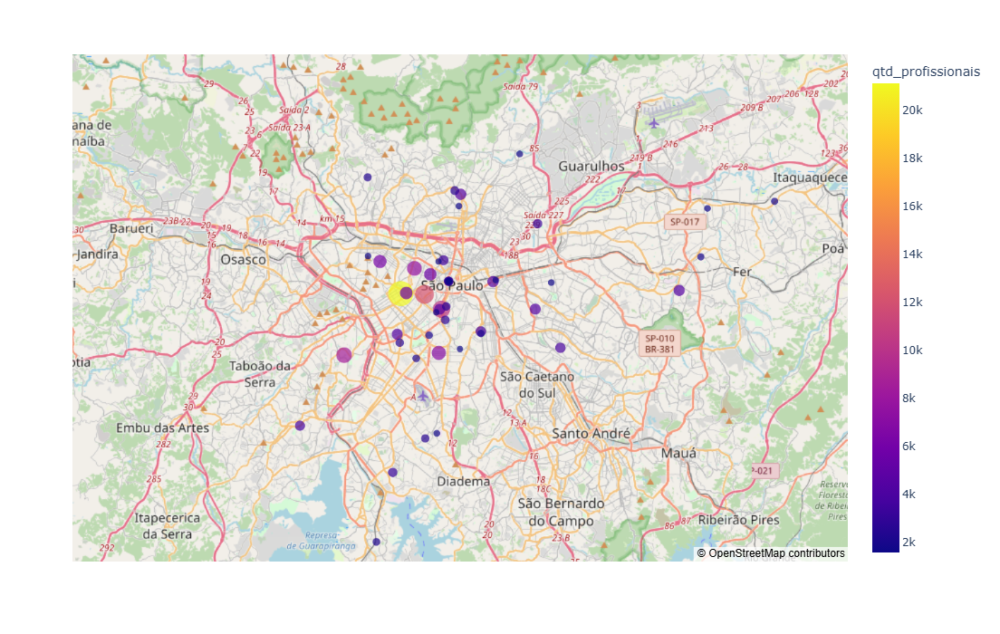

In [94]:
# para fins de estudo iremos deixar somente os 50 primeiros para nao onerar a maquina

df_plot_1 = df_plot.head(50)

fig = px.scatter_mapbox(
    df_plot_1,
    lat="lat",
    lon="lon",
    size="qtd_profissionais",
    color="qtd_profissionais",
    hover_name="nome_fantasia",
    hover_data={"qtd_profissionais": True, "lat": False, "lon": False},
    zoom=10,
    height=700
)

# estilo do mapa
fig.update_layout(mapbox_style="open-street-map")
fig.show()

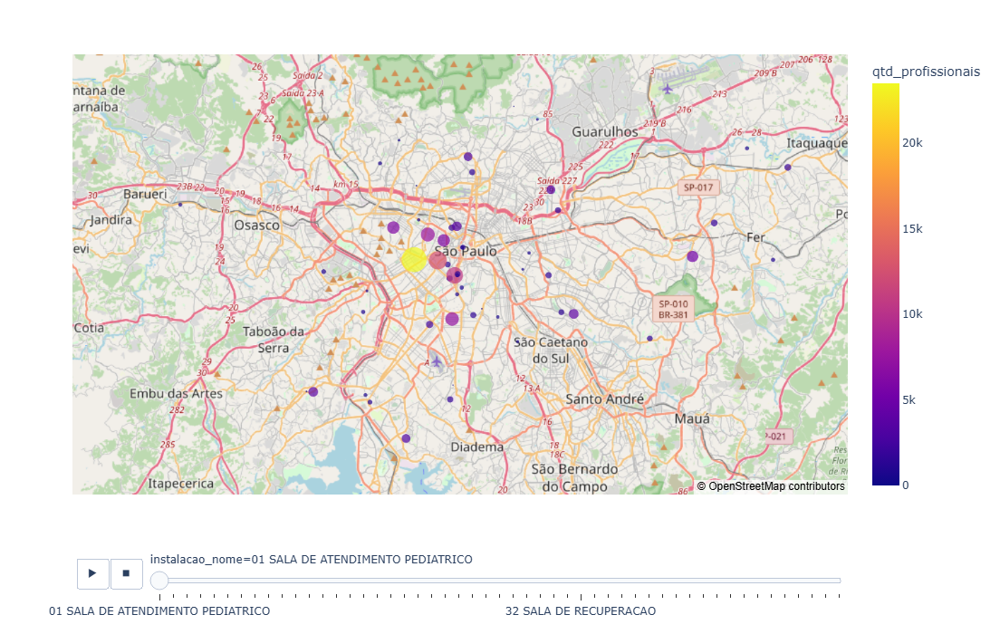

In [103]:
# podemos também filtrar para o tipo de instalacao que o paciente necessita, exemplo se ele está precisando ir em uma clinica odontologica, nao faz sentido ele ir em um clinico geral, façamos da seguinte forma:

df_map = (
    base_prof_inst.groupby(["instalacao_codigo", "instalacao_nome", "lat", "lon"])["profissional_cns"]
    .count()  # ou .nunique() se quiser só profissionais distintos
    .reset_index(name="qtd_profissionais")
    .dropna(subset=["lat", "lon", "qtd_profissionais"])
)

# Plot com filtro (dropdown) por instalação
fig = px.scatter_mapbox(
    df_map,
    lat="lat",
    lon="lon",
    size="qtd_profissionais",
    color="qtd_profissionais",
    hover_name="instalacao_nome",
    hover_data={"qtd_profissionais": True, "lat": False, "lon": False},
    zoom=10,
    height=700,
    animation_frame="instalacao_nome"   # cria um "filtro" por instalação
)

fig.update_layout(mapbox_style="open-street-map")
fig.show()